In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

In [2]:
from scripts.feature_eng.feature_eng import process_data
from scripts.feature_eng.feature_eng import impute_cat_columns
from scripts.feature_eng.feature_eng import encode_cols
from scripts.model.utils import feature_selection
from scripts.model.model_params import param_grid
from scripts.model.utils import train_model, get_report, plot_precision_recall_curve, plot_roc_curve

In [3]:
random_state=2024

In [4]:
%matplotlib inline

## Data Extraction

### Load Data and Data dictionary

In [5]:
data = pd.read_excel('./data/Assessment.xlsx', sheet_name='Data')
data_dictionary = pd.read_excel('./data/Assessment.xlsx', sheet_name='Data Dictionary')

## Data Transformation
 - Data Cleaning
 - Data visualization 
 - Missing Value detection and imputation
 - Feature generation
 - Feature data type casting
 - Feature selection

### Process the input data

In [6]:
data = process_data(data)

c_seg
NORMAL      55157
AFFLUENT    10926
Name: count, dtype: int64


In [7]:
x_cols = ['c_edu', 'c_hse', 'incm_typ', 'gn_occ', 'num_prd', 'casatd_cnt', 'mthcasa', 'maxcasa', 'mincasa', 'drvcr', 'mthtd', 'maxtd', 'asset_value', 'hl_tag', 'al_tag', 'pur_price_avg',
       'ut_ave', 'maxut', 'n_funds', 'cc_ave', 'max_mth_trn_amt', 'min_mth_trn_amt', 'avg_trn_amt', 'ann_trn_amt', 'ann_n_trx', 'cc_lmt','age_bin', 'wealth_accumulation', 
       'monthly_txn_frequency', 'credit_utilization', 'savings_behaviour', 'debt_to_asset_ratio', 'txn_freq_per_prd', 'investment_to_debt_ratio']

In [8]:
cat_cols = ['c_edu', 'c_hse', 'incm_typ', 'gn_occ', 'age_bin', 'hl_tag', 'al_tag', 'savings_behaviour']

In [9]:
cols_to_encode = ['c_edu', 'c_hse', 'gn_occ', 'age_bin']
num_cols = [i for i in x_cols if i not in cat_cols]

In [10]:
count_df = pd.DataFrame(data.groupby('c_id')['c_age'].count().reset_index())
count_df.rename(columns={'c_age': 'id_count'}, inplace=True)
duplicate_c_id = count_df[count_df.id_count >1]['c_id'].values.tolist()
non_duplicate_c_id = count_df[count_df.id_count ==1]['c_id'].values.tolist()

In [11]:
print(f"Number of unique customers: {count_df.shape[0]}")
print(f"% of customers with one record in the dataset {round(100*len(non_duplicate_c_id)/count_df.shape[0], 3)} %")
print(f"% of customers with multiple records for the same customer ID's {round(100*len(duplicate_c_id)/count_df.shape[0], 3)} %")

Number of unique customers: 47857
% of customers with one record in the dataset 69.94 %
% of customers with multiple records for the same customer ID's 30.06 %


In [12]:
non_duplicate_df = data[data.c_id.isin(non_duplicate_c_id)].copy()
duplicate_df = data[data.c_id.isin(duplicate_c_id)].copy()

### Remove duplicate rows for customers who have multiple records with the same customer ID, keeping only one instance of the repeated rows.

In [13]:
duplicate_df.drop_duplicates(inplace=True)

In [14]:
data = pd.concat([non_duplicate_df, duplicate_df])
data.reset_index(inplace=True, drop=True)

### Impute categorical columns: Replace the null value with the word "UNKNOWN"

In [15]:
data = impute_cat_columns(df=data, cat_columns=cat_cols)

### Missing Values estimation & removal

|    | Column_Name              |   Proportion |
|---:|:-------------------------|-------------:|
|  0 | pc                       |         0.74 |
|  1 | casatd_cnt               |        37.97 |
|  2 | mthcasa                  |        40.92 |
|  3 | maxcasa                  |        40.92 |
|  4 | mincasa                  |        40.92 |
|  5 | drvcr                    |        55.04 |
|  6 | mthtd                    |        78.66 |
|  7 | maxtd                    |        78.66 |
|  8 | pur_price_avg            |        91.55 |
|  9 | ut_ave                   |        95.95 |
| 10 | maxut                    |        95.95 |
| 11 | n_funds                  |        95.95 |
| 12 | cc_ave                   |        74.16 |
| 13 | max_mth_trn_amt          |        82.25 |
| 14 | min_mth_trn_amt          |        82.25 |
| 15 | avg_trn_amt              |        82.25 |
| 16 | ann_trn_amt              |        82.25 |
| 17 | ann_n_trx                |        82.25 |
| 18 | cc_lmt       

C:\Users\krish\AppData\Local\Temp\ipykernel_11772\1724794813.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x='Column_Name',y='Proportion',data=missing_val_df, palette = 'coolwarm')


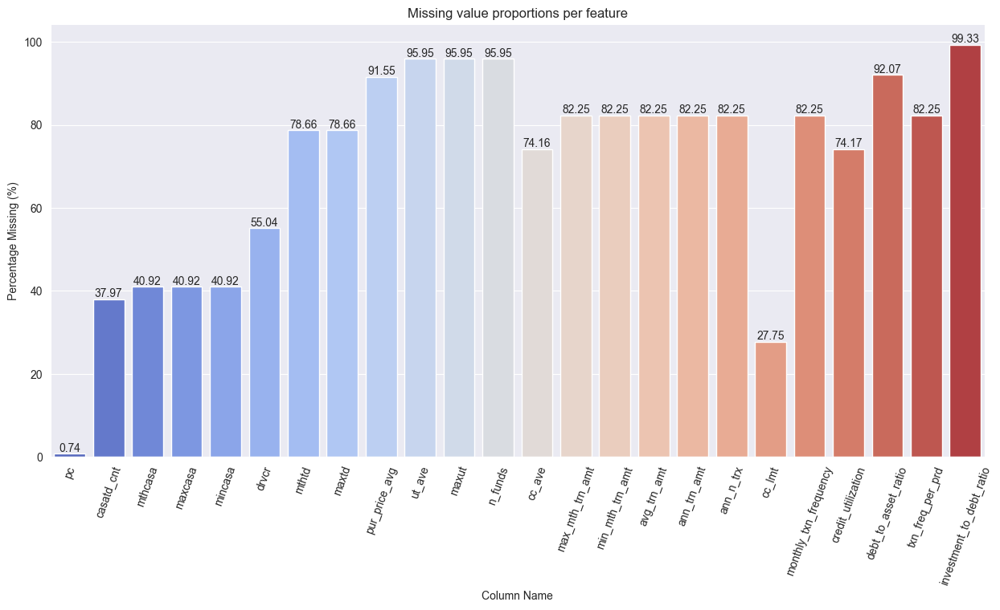

In [16]:
missing_values_proportion = [(i,round(100*j/data.shape[0], 2)) for i,j in zip(data.columns, data.isnull().sum(axis=0).values) if j>0]
missing_val_df = pd.DataFrame(missing_values_proportion,columns=['Column_Name','Proportion'])
print(missing_val_df.to_markdown())
plt.figure(figsize =(15, 7))
sns.set_style('darkgrid')
ax=sns.barplot(x='Column_Name',y='Proportion',data=missing_val_df, palette = 'coolwarm')
plt.xticks(rotation=70)
ax.set(xlabel='Column Name', ylabel='Percentage Missing (%)',title='Missing value proportions per feature')
for i in ax.containers:
    ax.bar_label(i,)
plt.show()

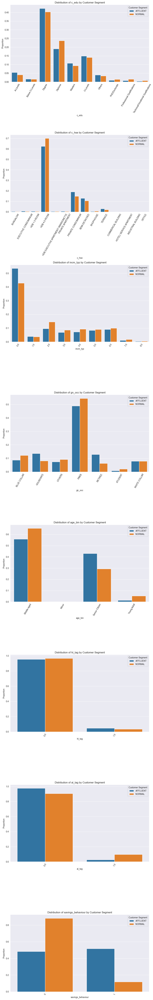

In [17]:
plot_cols = cat_cols.copy()
fig, axes = plt.subplots(nrows=len(plot_cols), ncols=1, figsize=(10, 8 * len(plot_cols)))

# Iterate through each categorical variable and create a bar plot
for i, var in enumerate(plot_cols):
    # Calculate proportions
    data_viz = data[data[var]!='UNKNOWN']
    proportions = data_viz.groupby(['c_seg', var]).size() / data_viz.groupby('c_seg').size()
    proportions = proportions.reset_index(name='Proportion')
    
    # Plot
    sns.barplot(x=var, y='Proportion', hue='c_seg', data=proportions, ax=axes[i])
    axes[i].set_title(f'Distribution of {var} by Customer Segment')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Proportion')
    axes[i].legend(title='Customer Segment')
    axes[i].tick_params(axis='x', labelrotation=60, labelsize=10)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

|    | c_seg    |   Proportion |
|---:|:---------|-------------:|
|  0 | AFFLUENT |     0.165338 |
|  1 | NORMAL   |     0.834662 |


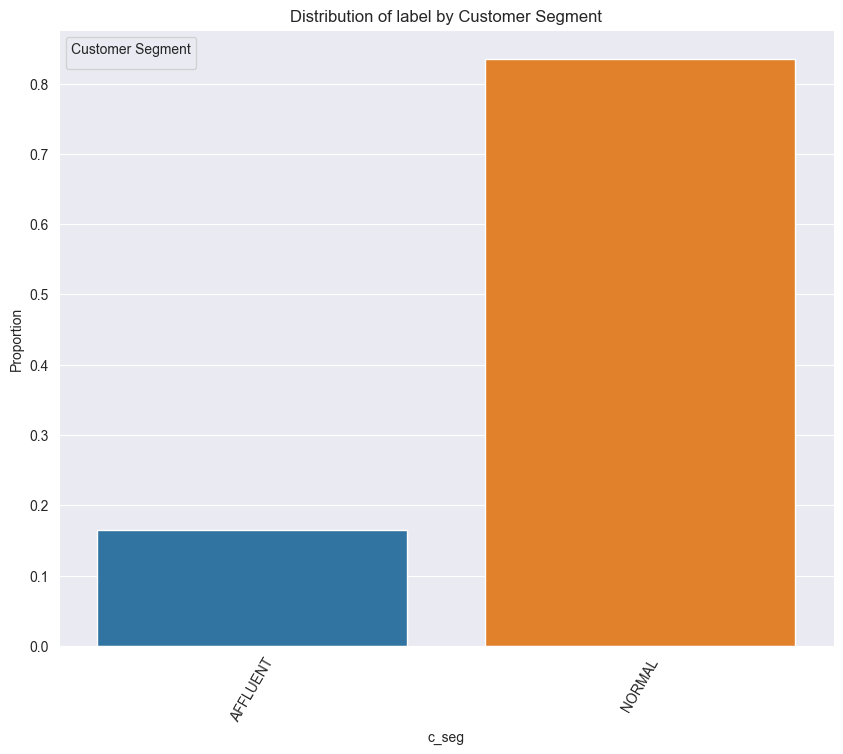

In [18]:
data.groupby('c_seg')
target_proportions = data.groupby(['c_seg']).size() / data.shape[0]
target_proportions = target_proportions.reset_index(name='Proportion')
print(target_proportions.to_markdown())
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 8))
sns.barplot(x='c_seg', y='Proportion', hue='c_seg', data=target_proportions, ax=axes)
axes.set_title(f'Distribution of label by Customer Segment')
axes.set_xlabel('c_seg')
axes.set_ylabel('Proportion')
axes.legend(title='Customer Segment')
axes.tick_params(axis='x', labelrotation=60, labelsize=10)

### Column processing and datatype casting
- Replace the null value with zero
- cast the categorical columns as `category` type 
- cast the numerical columns as `float64` type


In [19]:
data[num_cols] = data[num_cols].fillna(value=0)

data[cat_cols] = data[cat_cols].astype('category')
data[num_cols] = data[num_cols].astype('float64')

### Encode the following columns using LabelEncoder: 
- c_edu
- c_hse
- gn_occ
- age_bin

In [20]:
data = encode_cols(df=data, cols_to_encode=cols_to_encode)

### Pipeline for Numeric Data Transformation
This pipeline defines a preprocessing strategy for numeric data. It consists of a single step:
1. StandardScaler Transformation: StandardScaler is applied to scale numeric features to have mean 0 and variance 1.

In [21]:
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])
preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, num_cols)])

### Split the dataset into random training and test sets, with 80% of the records allocated to the training set and 20% to the test set. Ensure that the split is stratified based on the target variable.

In [22]:
X_train, X_test, Y_train, Y_test = train_test_split(data[x_cols], data['target'], test_size=0.2, random_state=random_state, stratify=data['target'])

In [23]:
X_train.reset_index(inplace=True, drop=True)
X_test.reset_index(inplace=True, drop=True)


Y_train = Y_train.reset_index(drop=True)
Y_test = Y_test.reset_index(drop=True)

## Feature Selection

In [24]:
clf = RandomForestClassifier(max_features='log2', n_jobs=-1, random_state=random_state, class_weight='balanced')

In [25]:
selector, selected_cols, selected_num_cols, selected_cat_cols = feature_selection(X=X_train[x_cols], 
                                                                                  Y=Y_train, 
                                                                                  cat_cols=cat_cols, 
                                                                                  num_cols=num_cols, 
                                                                                  clf=clf, 
                                                                                  scoring='f1', 
                                                                                  method='load')

## Model Training & Evaluation

Model Name: LogisticRegression


C:\Users\krish\.conda\envs\env_mb\lib\site-packages\sklearn\linear_model\_logistic.py:1216: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(


********************************************************************************************************************************************************************************************************


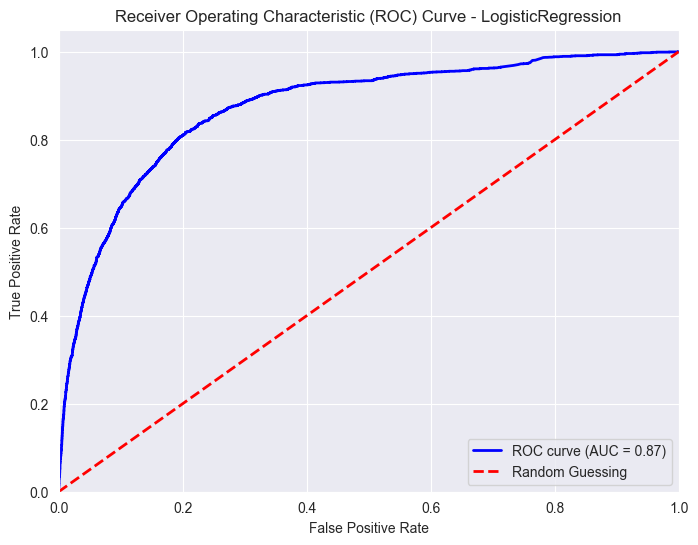

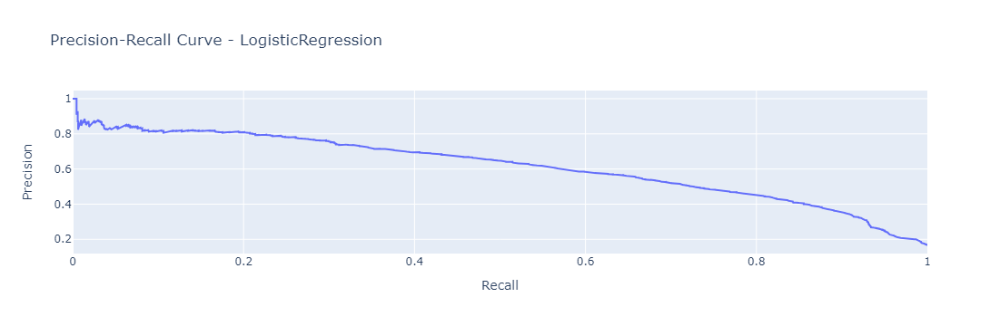

********************************************************************************************************************************************************************************************************
Model Name: RandomForestClassifier
********************************************************************************************************************************************************************************************************


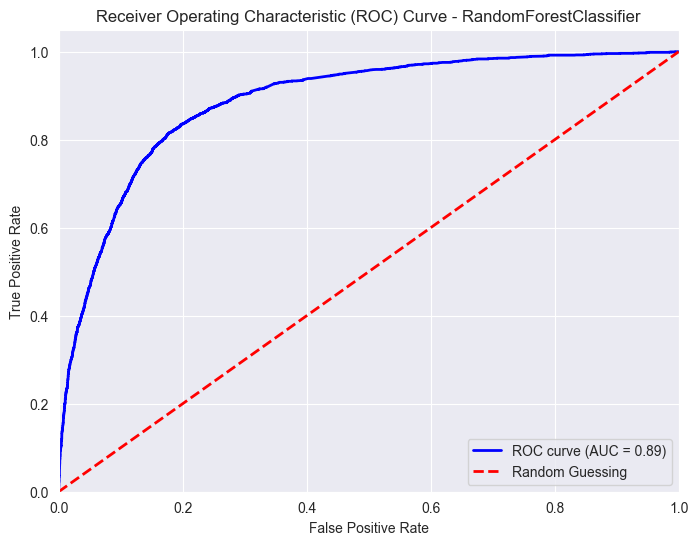

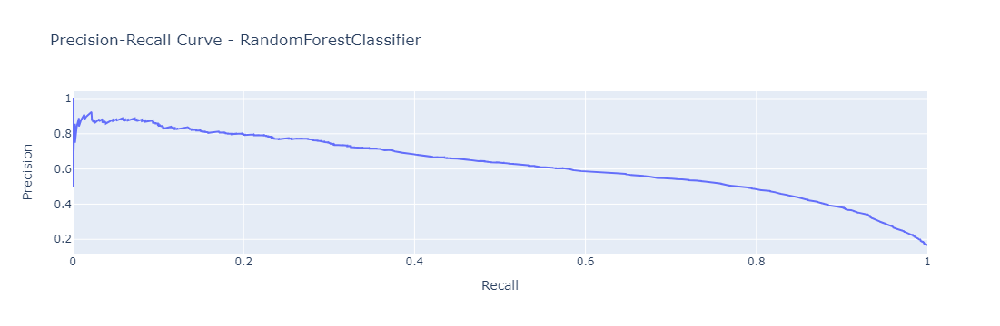

********************************************************************************************************************************************************************************************************
Model Name: ExtraTreesClassifier
********************************************************************************************************************************************************************************************************


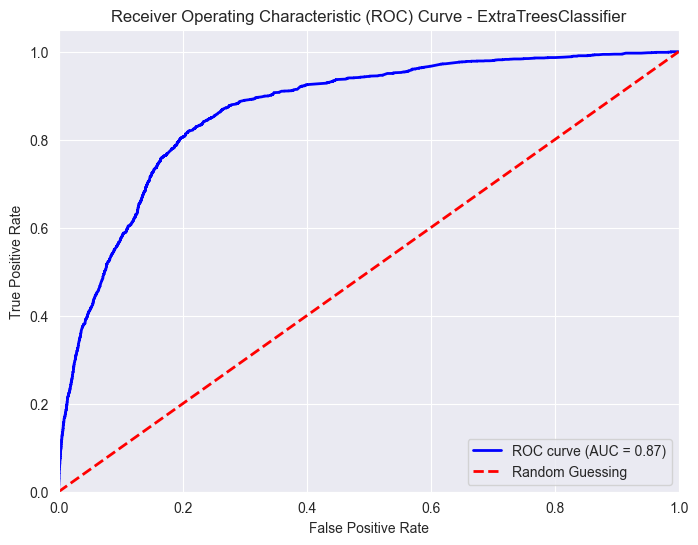

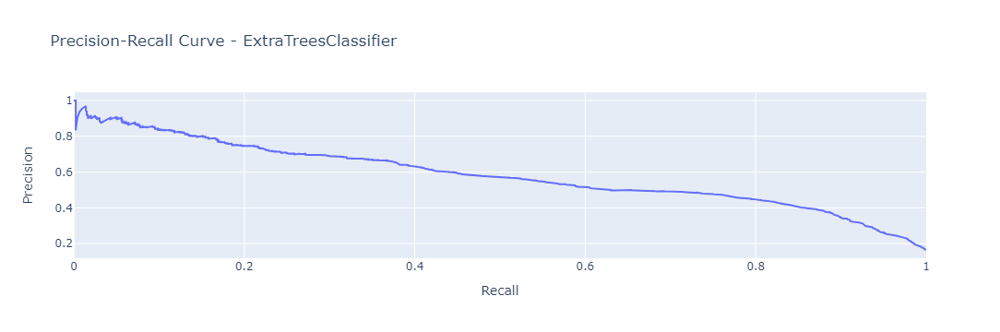

********************************************************************************************************************************************************************************************************


In [26]:
model_dict = {}
metrics_list = []
for model_name, model_attr in param_grid.items():
    print(f'Model Name: {model_name}')
    if model_name in ['LogisticRegression', 'MLPClassifier']:
        X_train_processed = preprocessor.fit_transform(X_train)
        X_train_processed = pd.DataFrame(X_train_processed, columns=num_cols)
        X_train_processed = pd.concat([X_train_processed, X_train[cat_cols]], axis=1)
        X_train_df = X_train_processed[selected_cols].copy()

        X_test_processed = preprocessor.fit_transform(X_test)
        X_test_processed = pd.DataFrame(X_test_processed, columns=num_cols)
        X_test_processed = pd.concat([X_test_processed, X_test[cat_cols]], axis=1)
        X_test_df = X_test_processed[selected_cols].copy()
    else:
        X_train_df = X_train[selected_cols].copy()
        X_test_df = X_test[selected_cols].copy()

    grid_search, best_estimator = train_model(X=X_train_df, 
                                              Y=Y_train, 
                                              model_name=model_name, 
                                              model=model_attr['model'], 
                                              model_param_grid=model_attr['param_grid'])
    predicted_probabilities = best_estimator.predict_proba(X_test_df)
    model_dict[f'{model_name}'] = {'model': best_estimator, 'search_meta': grid_search}

    print(''.join(200*['*']))
    plot_roc_curve(y_true=Y_test, predicted_prob=predicted_probabilities, model_name=model_name)
    plot_precision_recall_curve(y_true=Y_test, predicted_prob=predicted_probabilities, model_name=model_name)
    print(''.join(200*['*']))

    model_metrics_df = get_report(y_true=Y_test, predicted_prob=predicted_probabilities, model_name=model_name)
    metrics_list.append(model_metrics_df)

metrics_df = pd.concat(metrics_list)

## Feature Importance

In [27]:
summary_list = metrics_df['summary'].values
model_list = metrics_df['Model_name'].values
threshold_list = metrics_df['Threshold'].values
cols = ['NORMAL', 'AFFLUENT']

In [28]:
result_temp = []
for summary, model_name, threshold in zip(summary_list, model_list, threshold_list):
    temp_df = pd.DataFrame(summary)[cols].T
    temp_df['threshold'] = threshold
    temp_df['Model Name'] = model_name
    result_temp.append(temp_df)
s_df = pd.concat(result_temp)
s_df.reset_index(inplace=True)
s_df.rename(columns={'index': 'class_d'}, inplace=True)
aff_s_df = s_df[s_df.class_d == 'AFFLUENT'].copy()
aff_s_df.reset_index(inplace=True, drop=True)
aff_s_df.sort_values('precision', ascending=False, inplace=True)
best_model = model_dict['RandomForestClassifier']['model']

In [29]:
feature_importance_df = pd.DataFrame()
feature_importance_df['feature'] =  selected_cols
feature_importance_df['importance'] =  best_model.feature_importances_
feature_importance_df.sort_values('importance',ascending=False, inplace=True)

### Plot feature importance

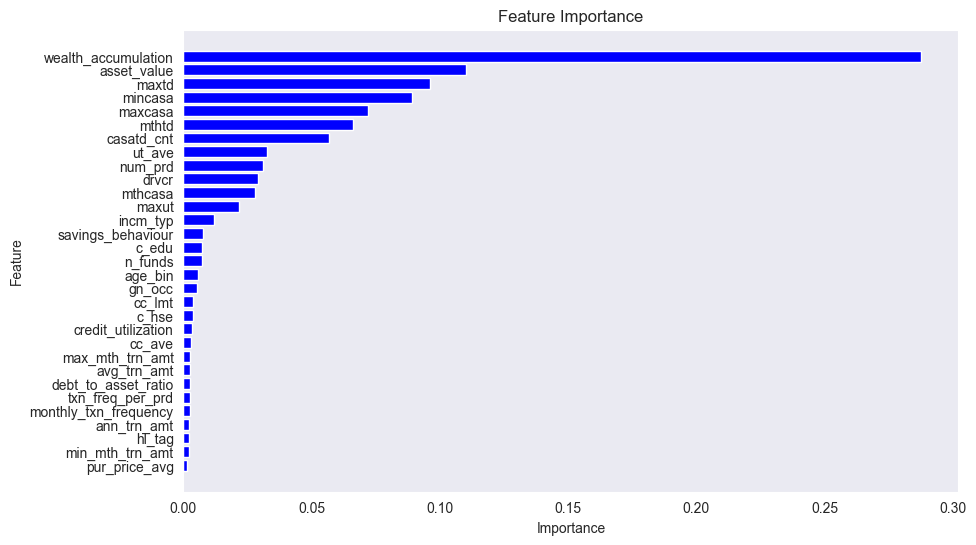

In [30]:
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['feature'], feature_importance_df['importance'], color='blue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest importance at the top
plt.grid(False) 
plt.show()

## Observation

In [31]:
# remove the outliers
plot_temp = data[data.wealth_accumulation < 50000].copy()

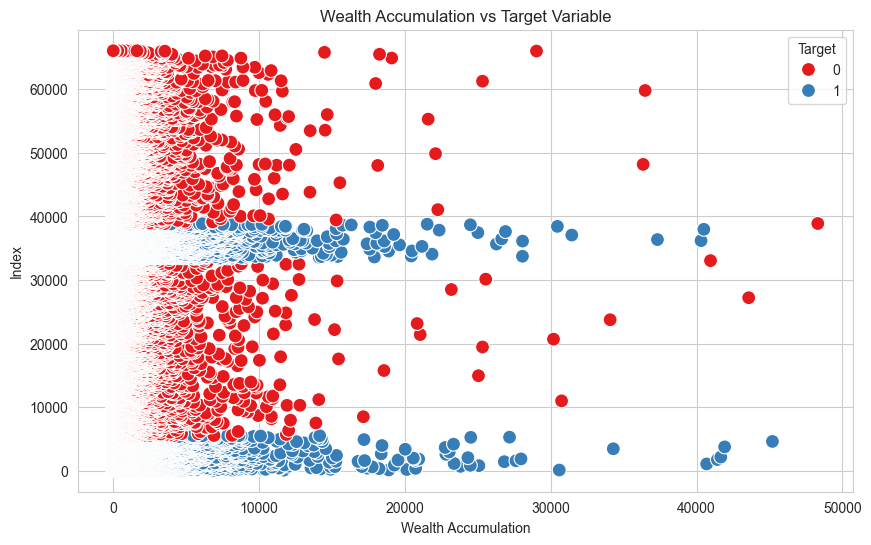

In [32]:
sns.set_style("whitegrid")
# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=plot_temp['wealth_accumulation'], y=np.arange(len(plot_temp)), hue=plot_temp['target'], palette='Set1', s=100)
plt.title('Wealth Accumulation vs Target Variable')
plt.xlabel('Wealth Accumulation')
plt.ylabel('Index')
plt.legend(title='Target')
plt.show()

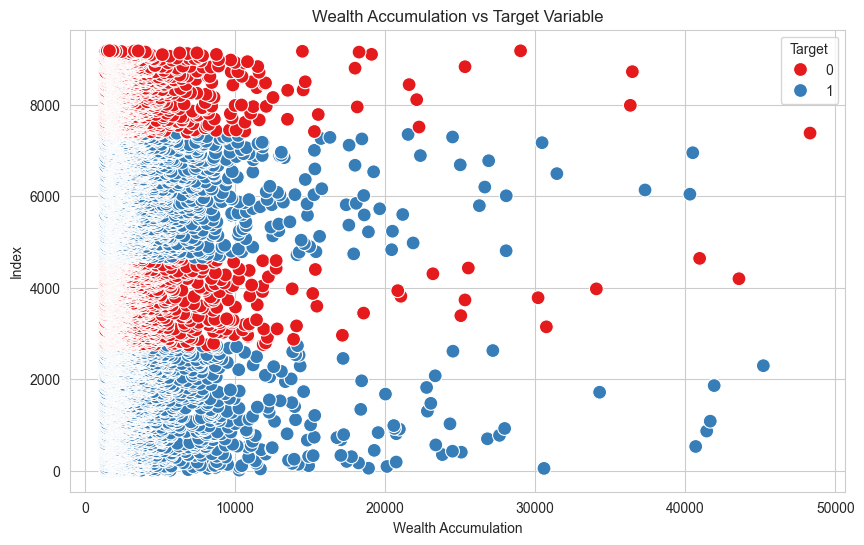

In [33]:
# Plot
plot_temp_1 = plot_temp[plot_temp.wealth_accumulation >=1363.637012].copy()
plt.figure(figsize=(10, 6))
sns.scatterplot(x=plot_temp_1['wealth_accumulation'], y=np.arange(len(plot_temp_1)), hue=plot_temp_1['target'], palette='Set1', s=100)
plt.title('Wealth Accumulation vs Target Variable')
plt.xlabel('Wealth Accumulation')
plt.ylabel('Index')
plt.legend(title='Target')
plt.show()

In [34]:
plot_temp_1.groupby('c_seg').count()

,c_id,c_age,c_edu,c_hse,pc,incm_typ,gn_occ,num_prd,casatd_cnt,mthcasa,...,cc_lmt,age_bin,wealth_accumulation,monthly_txn_frequency,credit_utilization,savings_behaviour,debt_to_asset_ratio,txn_freq_per_prd,investment_to_debt_ratio,target
c_seg,,,,,,,,,,,,,,,,,,,,,
AFFLUENT,5460,5460,5460,5460,5217,5460,5460,5460,5460,5460,...,5460,5460,5460,5460,5460,5460,5460,5460,5460,5460
NORMAL,3722,3722,3722,3722,3722,3722,3722,3722,3722,3722,...,3722,3722,3722,3722,3722,3722,3722,3722,3722,3722


In [35]:
plot_temp.groupby(['c_seg'])['wealth_accumulation'].describe()

,count,mean,std,min,25%,50%,75%,max
c_seg,,,,,,,,
AFFLUENT,10920.0,2074.191244,2831.931746,0.0,548.895433,1363.637012,2569.617043,45200.011250
NORMAL,55150.0,328.680022,1069.999620,0.0,0.000000,4.378062,167.217477,48312.248471
